In [ ]:
import os
os.kill(os.getpid(), 9)

In [5]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import plotly.graph_objects as go
from skimage import exposure
import scipy.stats as st
from tqdm import tqdm
import seaborn as sns

In [6]:
%cd /content/drive/MyDrive/DIP_src/2_assign/

/content/drive/MyDrive/DIP_src/2_assign


# Question 1: Low Pass Filtering

In [266]:
q1jpg = cv2.imread("ceramic.jpg", cv2.IMREAD_GRAYSCALE)
print(q1jpg.shape)
q1crop = cv2.resize(q1jpg, (200,200))
print(q1crop.shape)

(800, 800)
(200, 200)


## Part 1: Naive Mean

In [195]:
def applyFilter(img,filt):
    m,n = img.shape
    h = filt.shape[0]//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = filt.shape[0]%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    ret_img[u][v] += padded_img[u+i][v+j] * filt[h+i][h+j]
    return ret_img

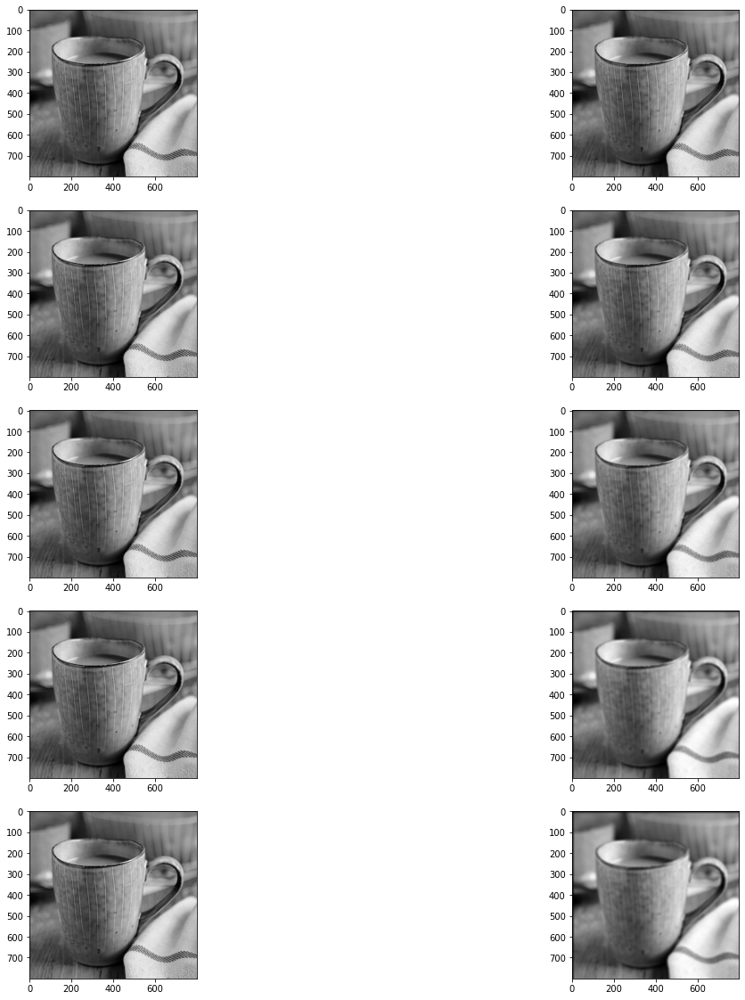

In [198]:
k = 5
ks = [3,5,7,11,13]
q1means = []
mean_fil = np.ones((k,k))/k**2

for k in ks:
  mean_fil = np.ones((k,k))/k**2
  q1means.append(applyFilter(q1jpg, mean_fil))

fig, axs = plt.subplots(5,2,figsize=(20,20))
for i in range(5):
  axs[i][0].imshow(q1jpg, cmap='gray')
  axs[i][1].imshow(q1means[i], cmap='gray')


## Part 2: Efficient Mean

In [41]:
def avgFilterEff(img,k):
    m,n = img.shape
    h=k//2
    a=np.zeros((2*h+m,2*h+n))
    a[h:-h,h:-h]=img
    a=np.cumsum(a,axis=0)
    a=np.cumsum(a,axis=1)
    a[k:m+2*h,:] -= a[:m+2*h-k,:]     
    a[:,k:n+2*h] -= a[:,:n+2*h-k]
    temp = np.round(a[k-1:,k-1:]/k**2)
    return temp

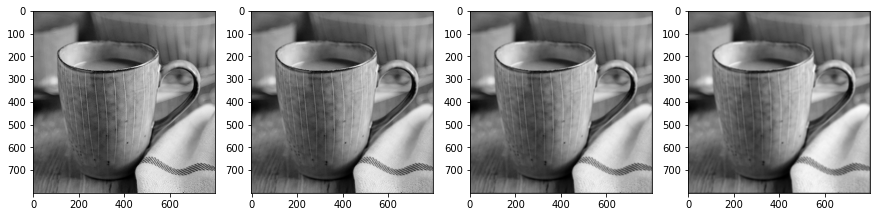

In [267]:
cup = cv2.imread("ceramic.jpg",cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(1,4,figsize=(15,15))
axs[0].imshow(cup,cmap='gray')
axs[1].imshow(avgFilterEff(cup,3),cmap='gray')
axs[2].imshow(avgFilterEff(cup,5),cmap='gray')
axs[3].imshow(avgFilterEff(cup,7),cmap='gray')

## Part 3: k vs run-time

In [275]:
from time import time
cup=cv2.imread("ceramic.jpg",cv2.IMREAD_GRAYSCALE)
cup1=cv2.resize(cup,(200,200),interpolation = cv2.INTER_AREA)
cup2=cv2.resize(cup,(100,100),interpolation = cv2.INTER_AREA)
naive=[]
eff=[]
lib=[]
naive1=[]
eff1=[]
naive2=[]
eff2=[]

for i in tqdm(np.arange(3,25,2)):
    start=time()
    temp=applyFilter(cup,np.ones((i,i))/i**2)
    end=time()
    naive.append(end-start)
    start=time()
    temp=avgFilterEff(cup,i)
    end=time()
    eff.append(end-start)

    start=time()
    temp=applyFilter(cup1,np.ones((i,i))/i**2)
    end=time()
    naive1.append(end-start)
    start=time()
    temp=avgFilterEff(cup1,i)
    end=time()
    eff1.append(end-start)

    start=time()
    temp=applyFilter(cup2,np.ones((i,i))/i**2)
    end=time()
    naive2.append(end-start)
    start=time()
    temp=avgFilterEff(cup2,i)
    end=time()
    eff2.append(end-start)

100%|██████████| 11/11 [41:15<00:00, 225.09s/it]


[(0.0, 40.0), Text(0, 0.5, 'runtime (in seconds)'), Text(0.5, 0, 'k')]

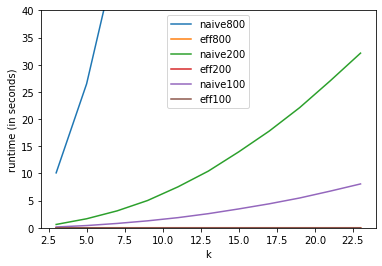

In [293]:
x = np.arange(3,25,2)
ax = sns.lineplot(x=x,y=naive, label="naive800")
ax = sns.lineplot(x=x,y=eff, label="eff800")
ax = sns.lineplot(x=x,y=naive1, label="naive200")
ax = sns.lineplot(x=x,y=eff1, label="eff200")
ax = sns.lineplot(x=x,y=naive2, label="naive100")
ax = sns.lineplot(x=x,y=eff2, label="eff100")
ax.set(xlabel="k", ylabel="runtime (in seconds)", ylim=(0,4 0))

## Part 4: Median Filter

In [36]:
def medianFilter(img, k):
    m,n = img.shape
    h = k//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = k%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            ret_img[u][v] = np.median(np.ravel(padded_img[u:u+k,v:v+k]))
            # lis = []
            # for i in range(-h,h+f):
            #     for j in range(-h,h+f):
            #         # ret_img[u][v] += padded_img[u+i][v+j] * filt[h+i][h+j]
            #         lis.append(padded_img[u+i][v+j])
            # ret_img[u][v] = np.median(lis)
    return ret_img

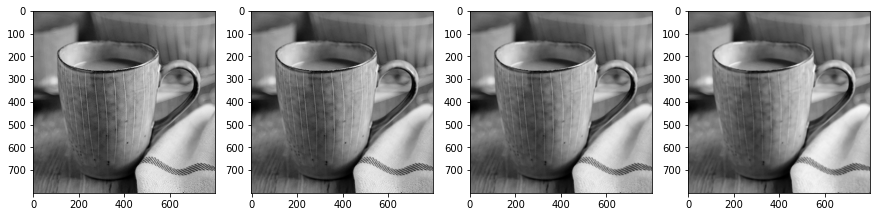

In [37]:
cup=cv2.imread("ceramic.jpg",cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(1,4,figsize=(15,15))
axs[0].imshow(cup,cmap='gray')
axs[1].imshow(medianFilter(cup,3),cmap='gray')
axs[2].imshow(medianFilter(cup,5),cmap='gray')
axs[3].imshow(medianFilter(cup,7),cmap='gray')

## Part 5: Noisy Brain

Because the noise is "salt and pepper noise" and that the noisy pixels have near extreme values, the median filter will be a best suited to remove the noise. 

Mean filter is easily affected by extreme value pixels, while Median filter is not.

Text(0.5, 1.0, 'Clean')

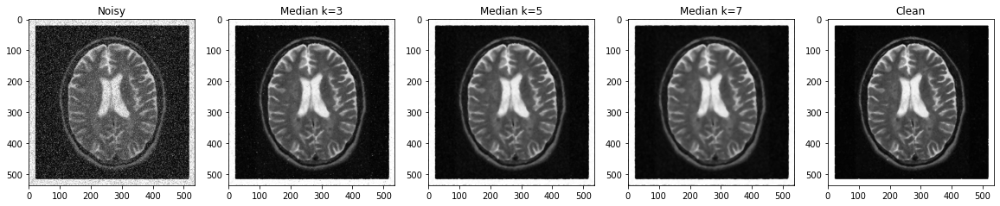

In [43]:
brain=cv2.imread("brain.jpg",cv2.IMREAD_GRAYSCALE)
brain_noisy=cv2.imread("brainNoisy.jpg",cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(1,5,figsize=(20,20))
axs[0].imshow(brain_noisy,cmap='gray')
axs[1].imshow(medianFilter(brain_noisy,3),cmap='gray')
axs[2].imshow(medianFilter(brain_noisy,5),cmap='gray')
axs[3].imshow(medianFilter(brain_noisy,7),cmap='gray')
axs[4].imshow(brain,cmap='gray')

axs[0].set_title('Noisy')
axs[1].set_title('Median k=3')
axs[2].set_title('Median k=5')
axs[3].set_title('Median k=7')
axs[4].set_title('Clean')

Text(0.5, 1.0, 'Clean')

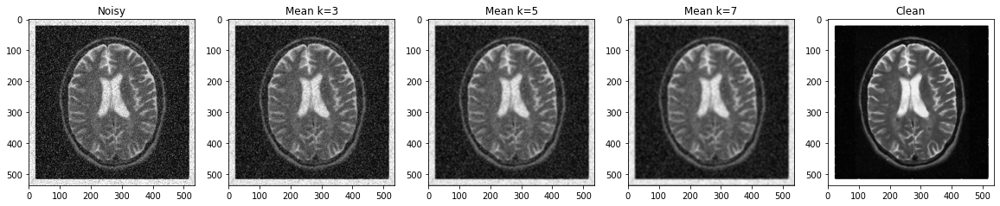

In [44]:
brain=cv2.imread("brain.jpg",cv2.IMREAD_GRAYSCALE)
brain_noisy=cv2.imread("brainNoisy.jpg",cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(1,5,figsize=(20,20))
axs[0].imshow(brain_noisy,cmap='gray')
axs[1].imshow(avgFilterEff(brain_noisy,3),cmap='gray')
axs[2].imshow(avgFilterEff(brain_noisy,5),cmap='gray')
axs[3].imshow(avgFilterEff(brain_noisy,7),cmap='gray')
axs[4].imshow(brain,cmap='gray')

axs[0].set_title('Noisy')
axs[1].set_title('Mean k=3')
axs[2].set_title('Mean k=5')
axs[3].set_title('Mean k=7')
axs[4].set_title('Clean')

Thus, as we see, Median Filter is best suited for such kind of noise.

# Question 2: Edge Detection

## Part 1: Canny

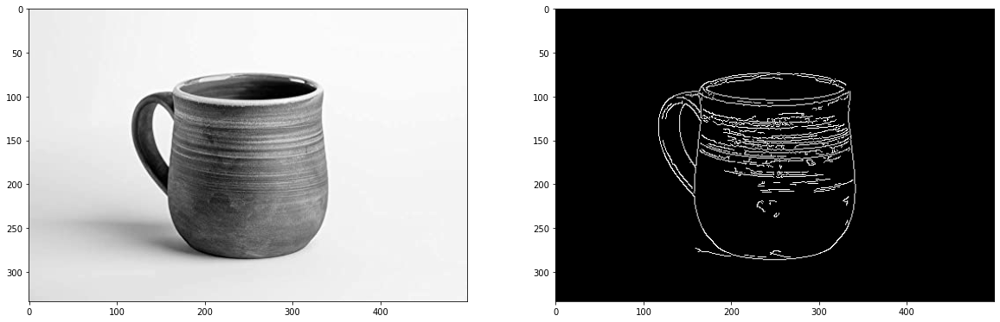

In [ ]:
q2cup = cv2.imread("cup.jpg", cv2.IMREAD_GRAYSCALE)
q2canny = cv2.Canny(q2cup,100,200)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(q2cup, cmap='gray')
axs[1].imshow(q2canny, cmap='gray')

## Part 2: Tuning Canny

### 1. minVal = maxVal

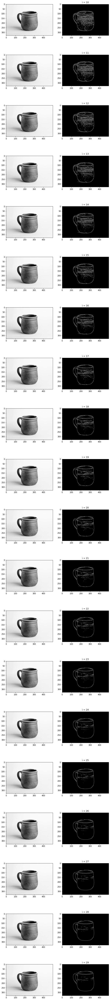

In [ ]:
fig, axs = plt.subplots(20,2, figsize=(10,100))
for i in range(10,30):
  q2canny = cv2.Canny(q2cup, i*10, i*10)
  axs[i-10][0].imshow(q2cup, cmap='gray')
  axs[i-10][1].imshow(q2canny, cmap='gray')
  axs[i-10][1].set_title('i = '+str(i))

### 2. Fixed minVal

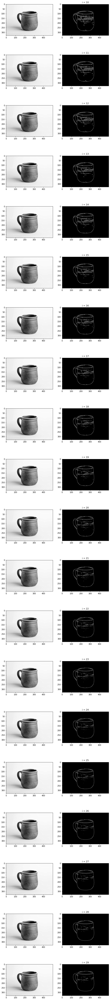

In [ ]:
fig, axs = plt.subplots(20,2, figsize=(10,100))
for i in range(10,30):
  q2canny = cv2.Canny(q2cup, 240, i*10)
  axs[i-10][0].imshow(q2cup, cmap='gray')
  axs[i-10][1].imshow(q2canny, cmap='gray')
  axs[i-10][1].set_title('i = '+str(i))

### Fixed maxVal

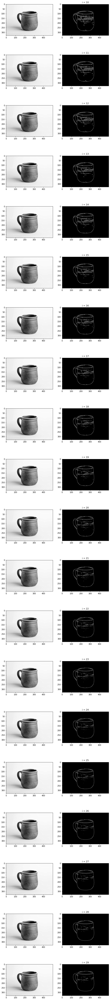

In [ ]:
fig, axs = plt.subplots(20,2, figsize=(10,100))
for i in range(10,30):
  q2canny = cv2.Canny(q2cup, i*10, 240)
  axs[i-10][0].imshow(q2cup, cmap='gray')
  axs[i-10][1].imshow(q2canny, cmap='gray')
  axs[i-10][1].set_title('i = '+str(i))

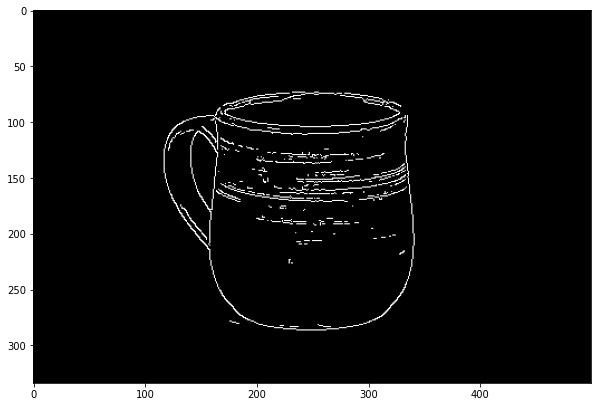

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.Canny(q2cup, 180, 220), cmap='gray')

minVal $=180$

maxVal $=220$

## Part 3: Prewitt, Sobel, Roberts, Laplacian, Canny

In [ ]:
def applyFilter(img,filt):
    m,n = img.shape
    h = filt.shape[0]//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = filt.shape[0]%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    ret_img[u][v] += padded_img[u+i][v+j] * filt[h+i][h+j]
    return ret_img

Text(0.5, 1.0, 'original')

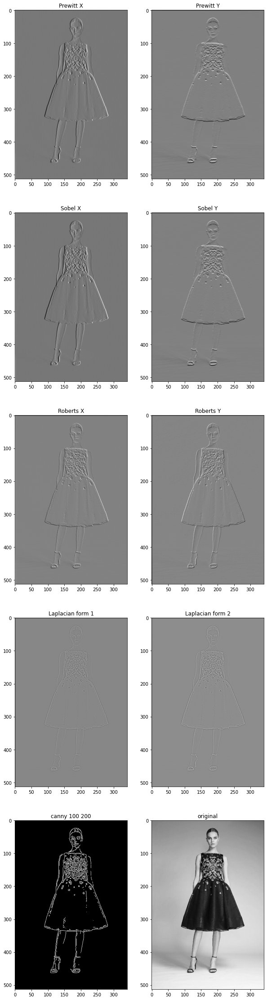

In [ ]:
q2girl = cv2.imread("girl.jpg", cv2.IMREAD_GRAYSCALE)
prewitt_x = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]])
prewitt_y = np.array([[ 1, 1, 1],
                      [ 0, 0, 0],
                      [-1,-1,-1]])

sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])
sobel_y = np.array([[ 1, 2, 1],
                    [ 0, 0, 0],
                    [-1,-2,-1]])

roberts_x = np.array([[ 0, 1],
                      [-1, 0]])
roberts_y = np.array([[ 1, 0],
                      [ 0,-1]])

laplacian_1 = np.array([[ 0, 1, 0],
                        [ 1,-4, 1],
                        [ 0, 1, 0]])
laplacian_2 = np.array([[ 1, 1, 1],
                        [ 1,-8, 1],
                        [ 1, 1, 1]])

fig, axs = plt.subplots(5,2,figsize=(10,40))

axs[0][0].imshow(applyFilter(q2girl,prewitt_x),cmap='gray')
axs[0][0].set_title('Prewitt X')
axs[0][1].imshow(applyFilter(q2girl,prewitt_y),cmap='gray')
axs[0][1].set_title('Prewitt Y')
axs[1][0].imshow(applyFilter(q2girl,sobel_x),cmap='gray')
axs[1][0].set_title('Sobel X')
axs[1][1].imshow(applyFilter(q2girl,sobel_y),cmap='gray')
axs[1][1].set_title('Sobel Y')
axs[2][0].imshow(applyFilter(q2girl,roberts_x),cmap='gray')
axs[2][0].set_title('Roberts X')
axs[2][1].imshow(applyFilter(q2girl,roberts_y),cmap='gray')
axs[2][1].set_title('Roberts Y')
axs[3][0].imshow(applyFilter(q2girl,laplacian_1),cmap='gray')
axs[3][0].set_title('Laplacian form 1')
axs[3][1].imshow(applyFilter(q2girl,laplacian_2),cmap='gray')
axs[3][1].set_title('Laplacian form 2')
axs[4][0].imshow(cv2.Canny(q2girl,130,150),cmap='gray')
axs[4][0].set_title('canny 100 200')
axs[4][1].imshow(q2girl,cmap='gray')
axs[4][1].set_title('original')

## Part 4: Prewitt, Sobel 5x5

Text(0.5, 1.0, 'Sobel Y 5x5')

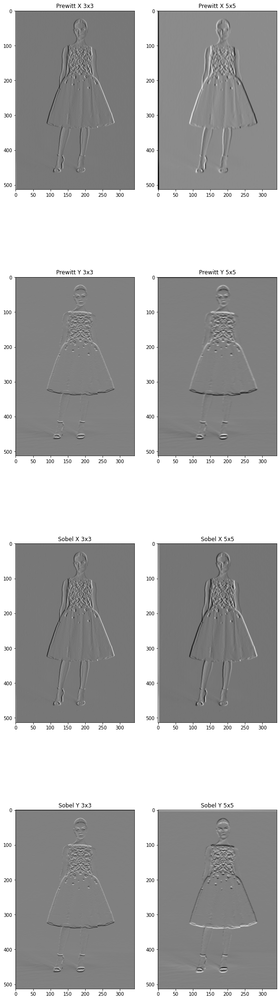

In [ ]:
prewitt3_x = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]])
prewitt3_y = np.array([[ 1, 1, 1],
                      [ 0, 0, 0],
                      [-1,-1,-1]])

prewitt5_x = np.array([[ 1, 1, 0,-1,-1],
                       [ 1, 1, 0,-1,-1],
                       [ 1, 1, 0,-1,-1],
                       [ 1, 1, 0,-1,-1],
                       [ 1, 1, 0,-1,-1]])
prewitt5_y = np.array([[ 1, 1, 1, 1, 1],
                       [ 1, 1, 1, 1, 1],
                       [ 0, 0, 0, 0, 0],
                       [-1,-1,-1,-1,-1],
                       [-1,-1,-1,-1,-1]])

sobel3_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])
sobel3_y = np.array([[ 1, 2, 1],
                    [ 0, 0, 0],
                    [-1,-2,-1]])

sobel5_x = np.array([[ -1, -2,  0,  2,  1],
                     [ -4, -8,  0,  8,  4],
                     [ -6,-12,  0,  6, 12],
                     [ -4, -8,  0,  8,  4],
                     [ -1, -2,  0,  2,  1]])
sobel5_y = np.array([[ -1, -4, -6, -4, -1],
                     [ -2, -8,-12, -8, -2],
                     [  0,  0,  0,  0,  0],
                     [  2,  8,  6,  8,  2],
                     [  1,  4, 12,  4,  1]])

fig, axs = plt.subplots(4,2,figsize=(10,40))

axs[0][0].imshow(applyFilter(q2girl,prewitt3_x),cmap='gray')
axs[0][0].set_title('Prewitt X 3x3')
axs[0][1].imshow(applyFilter(q2girl,prewitt5_x),cmap='gray')
axs[0][1].set_title('Prewitt X 5x5')
axs[1][0].imshow(applyFilter(q2girl,prewitt3_y),cmap='gray')
axs[1][0].set_title('Prewitt Y 3x3')
axs[1][1].imshow(applyFilter(q2girl,prewitt5_y),cmap='gray')
axs[1][1].set_title('Prewitt Y 5x5')
axs[2][0].imshow(applyFilter(q2girl,sobel3_x),cmap='gray')
axs[2][0].set_title('Sobel X 3x3')
axs[2][1].imshow(applyFilter(q2girl,sobel5_x),cmap='gray')
axs[2][1].set_title('Sobel X 5x5')
axs[3][0].imshow(applyFilter(q2girl,sobel3_y),cmap='gray')
axs[3][0].set_title('Sobel Y 3x3')
axs[3][1].imshow(applyFilter(q2girl,sobel5_y),cmap='gray')
axs[3][1].set_title('Sobel Y 5x5')

The edges are much **more clearer** and **more minute details** are shown when *sobel* and *prewitt* filtering is done with **larger kernels**.

## Part 5: Noisy Source

Text(0.5, 1.0, 'original')

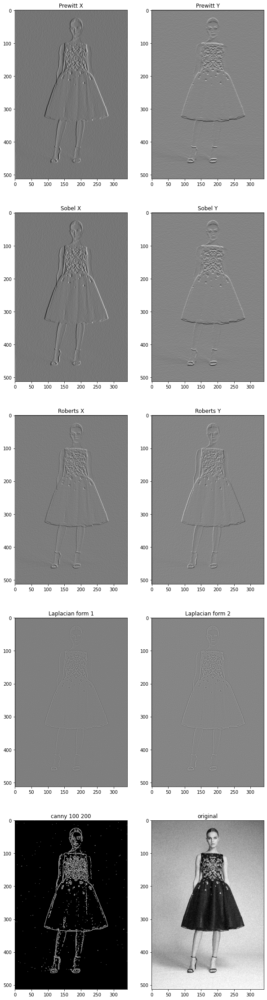

In [ ]:
q2noisy_1 = cv2.imread("girlNoisy1.jpg", cv2.IMREAD_GRAYSCALE)

fig, axs = plt.subplots(5,2,figsize=(10,40))

axs[0][0].imshow(applyFilter(q2noisy_1,prewitt_x),cmap='gray')
axs[0][0].set_title('Prewitt X')
axs[0][1].imshow(applyFilter(q2noisy_1,prewitt_y),cmap='gray')
axs[0][1].set_title('Prewitt Y')
axs[1][0].imshow(applyFilter(q2noisy_1,sobel_x),cmap='gray')
axs[1][0].set_title('Sobel X')
axs[1][1].imshow(applyFilter(q2noisy_1,sobel_y),cmap='gray')
axs[1][1].set_title('Sobel Y')
axs[2][0].imshow(applyFilter(q2noisy_1,roberts_x),cmap='gray')
axs[2][0].set_title('Roberts X')
axs[2][1].imshow(applyFilter(q2noisy_1,roberts_y),cmap='gray')
axs[2][1].set_title('Roberts Y')
axs[3][0].imshow(applyFilter(q2noisy_1,laplacian_1),cmap='gray')
axs[3][0].set_title('Laplacian form 1')
axs[3][1].imshow(applyFilter(q2noisy_1,laplacian_2),cmap='gray')
axs[3][1].set_title('Laplacian form 2')
axs[4][0].imshow(cv2.Canny(q2noisy_1,150,170),cmap='gray')
axs[4][0].set_title('canny 100 200')
axs[4][1].imshow(q2noisy_1,cmap='gray')
axs[4][1].set_title('original')

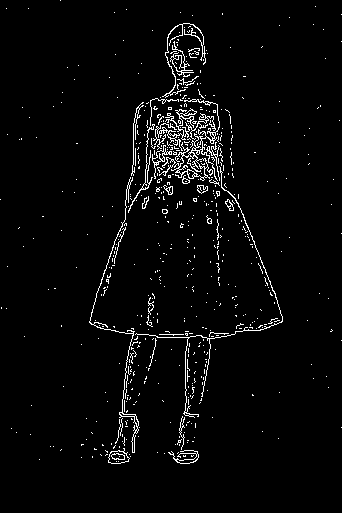

In [ ]:
cv2_imshow(cv2.Canny(q2noisy_1,150,170))

Text(0.5, 1.0, 'original')

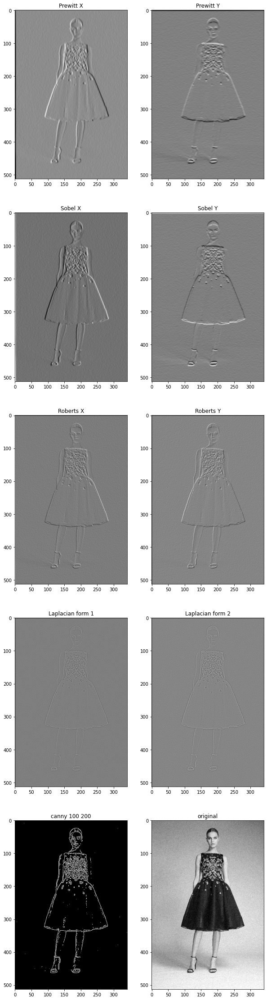

In [ ]:
q2noisy_2 = cv2.imread("girlNoisy1.jpg", cv2.IMREAD_GRAYSCALE)

fig, axs = plt.subplots(5,2,figsize=(10,40))

axs[0][0].imshow(applyFilter(q2noisy_2,prewitt5_x),cmap='gray')
axs[0][0].set_title('Prewitt X')
axs[0][1].imshow(applyFilter(q2noisy_2,prewitt5_y),cmap='gray')
axs[0][1].set_title('Prewitt Y')
axs[1][0].imshow(applyFilter(q2noisy_2,sobel5_x),cmap='gray')
axs[1][0].set_title('Sobel X')
axs[1][1].imshow(applyFilter(q2noisy_2,sobel5_y),cmap='gray')
axs[1][1].set_title('Sobel Y')
axs[2][0].imshow(applyFilter(q2noisy_2,roberts_x),cmap='gray')
axs[2][0].set_title('Roberts X')
axs[2][1].imshow(applyFilter(q2noisy_2,roberts_y),cmap='gray')
axs[2][1].set_title('Roberts Y')
axs[3][0].imshow(applyFilter(q2noisy_2,laplacian_1),cmap='gray')
axs[3][0].set_title('Laplacian form 1')
axs[3][1].imshow(applyFilter(q2noisy_2,laplacian_2),cmap='gray')
axs[3][1].set_title('Laplacian form 2')
axs[4][0].imshow(cv2.Canny(q2noisy_2,180,200),cmap='gray')
axs[4][0].set_title('canny 100 200')
axs[4][1].imshow(q2noisy_2,cmap='gray')
axs[4][1].set_title('original')

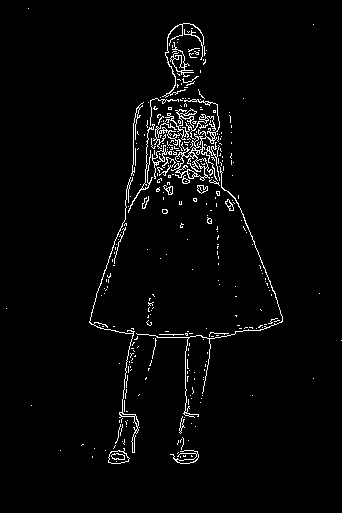

In [ ]:
cv2_imshow(cv2.Canny(q2noisy_2,180,200))

When noise is introduced, unneccassary artifacts are also introduced.

Sharp changes in intensity are recognised as edges in all the above edge filters. Since random noise is sharp, abrupt change in intensity, it is recognised as an egde and hence the images are also noisy.

This can be mitigated by using larger kernels for *sobel* and *prewitt* filters and higher minVal, maxVal for Canny filter.

# Question 3: Gaussian, Bilateral Filtering

## Gaussian Filter

In [51]:
def genGaussianFilter(sig, k):
  x = np.linspace(-sig, sig, k+1)
  kern1d = np.diff(st.norm.cdf(x))
  kern2d = np.outer(kern1d, kern1d)
  den = kern2d.sum()
  print(kern2d.sum())
  return kern2d/den

genGaussianFilter(sig=1,k=5)

0.4660649426743922


array([[0.02867168, 0.03633314, 0.0393175 , 0.03633314, 0.02867168],
       [0.03633314, 0.04604185, 0.04982366, 0.04604185, 0.03633314],
       [0.0393175 , 0.04982366, 0.0539161 , 0.04982366, 0.0393175 ],
       [0.03633314, 0.04604185, 0.04982366, 0.04604185, 0.03633314],
       [0.02867168, 0.03633314, 0.0393175 , 0.03633314, 0.02867168]])

In [57]:
def applyGaussianFilter(img,sig,k):
  return applyFilter(img, genGaussianFilter(sig,k))

  # for u in range(img.shape[0]):
  #   for v in range(img.shape[1]):
      


In [44]:
def applyFilter(img,filt):
    m,n = img.shape
    h = filt.shape[0]//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = filt.shape[0]%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    ret_img[u][v] += padded_img[u+i][v+j] * filt[h+i][h+j]
    return ret_img

0.02512840616148414
0.02512840616148414
0.2663310270962208
0.2663310270962208
0.46606494267439225
0.4660649426743922
0.8614426748745236
0.8614426748745236


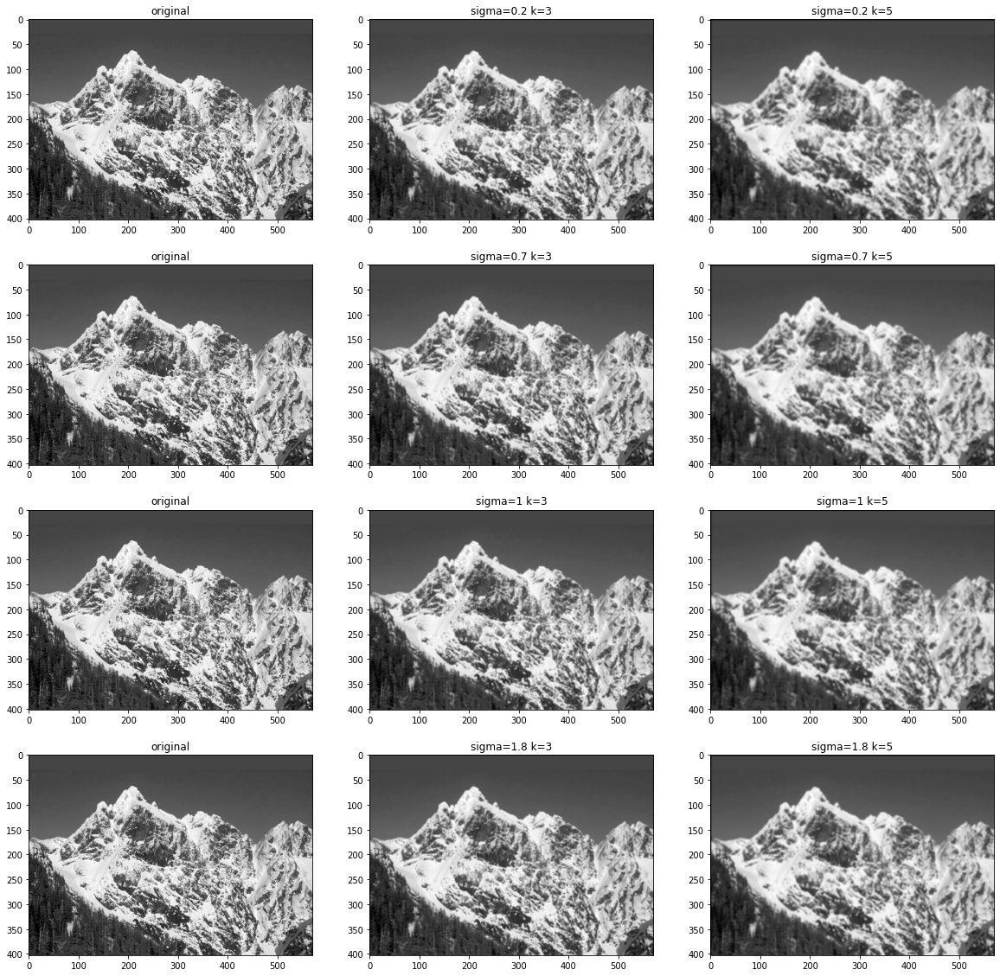

In [48]:
q3mnt = cv2.imread("mountain.png", cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(4,3,figsize=(20,20))
sig, k = 0.2, 3
sigs = [0.2, 0.7, 1, 1.8, 4]
for i in range(4):
  axs[i][0].imshow(q3mnt, cmap='gray')
  axs[i][0].set_title('original')
  axs[i][1].imshow(applyFilter(q3mnt, genGaussianFilter(sigs[i], 3)), cmap='gray')
  axs[i][1].set_title('sigma='+str(sigs[i])+' k=3')
  axs[i][2].imshow(applyFilter(q3mnt, genGaussianFilter(sigs[i], 5)), cmap='gray')
  axs[i][2].set_title('sigma='+str(sigs[i])+' k=5')

Optimal $\sigma$ for $k=3$ is $1$

Optimal $\sigma$ for $k=5$ is $1.8$

## Bilateral Filter

In [ ]:
import math
def applyBilateralFilter(img,d,r,k):
    m,n=img.shape
    h=k//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = k%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            den=0
            num=0
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    den += math.exp(-((padded_img[u+i][v+j] - padded_img[u][v])**2)/(2*r*r) - ((i)**2+(j)**2)/(2*d*d))
                    num += math.exp(-((padded_img[u+i][v+j] - padded_img[u][v])**2)/(2*r*r) - ((i)**2+(j)**2)/(2*d*d)) * padded_img[u+i][v+j]
            ret_img[u][v]=num/den
    return ret_img

Text(0.5, 1.0, 'bilateral: domain=10 range=20')

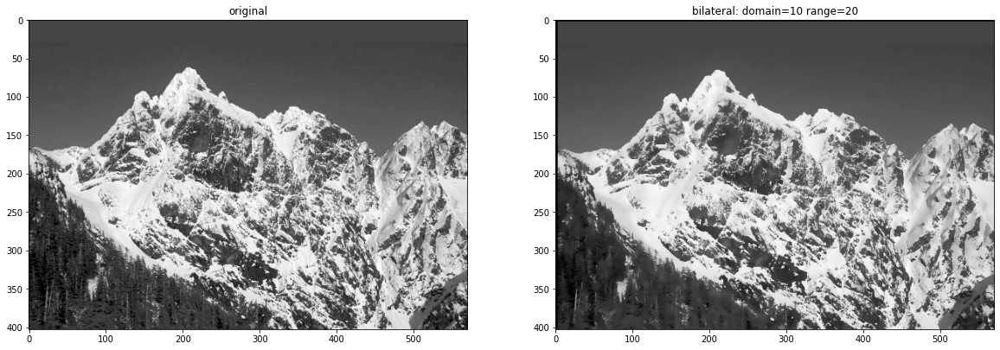

In [ ]:
q3mnt = cv2.imread("mountain.png",cv2.IMREAD_GRAYSCALE)
fig, axs = plt.subplots(1,2,figsize=(20,40))
axs[0].imshow(q3mnt,cmap='gray')
axs[0].set_title('original')
d,r = 10,20
axs[1].imshow(applyBilateralFilter(q3mnt,d,r,7),cmap='gray')
axs[1].set_title('bilateral: domain='+str(d)+' range='+str(r))

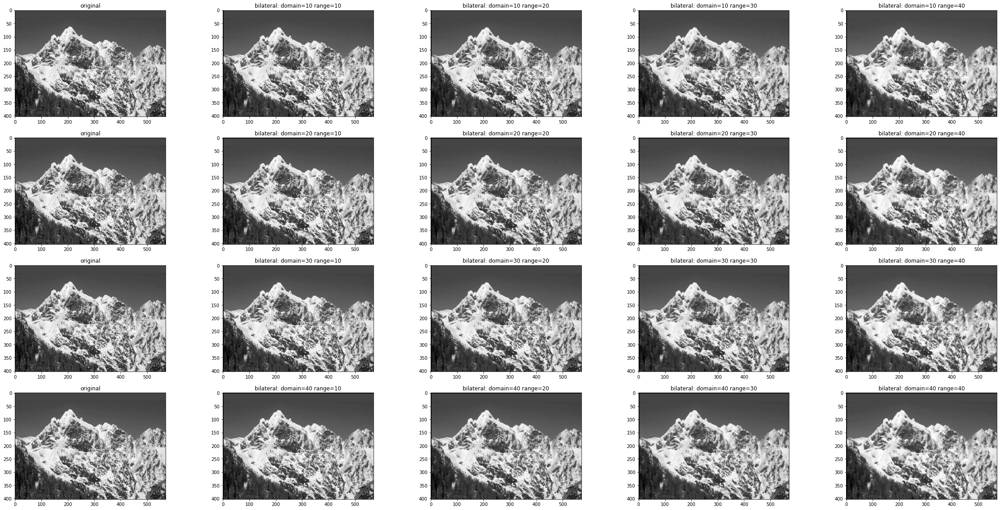

In [21]:
fig, axs = plt.subplots(4,5,figsize=(40,20))
for i in range(4):
  axs[i][0].imshow(q3mnt, cmap='gray')
  axs[i][0].set_title('original')
  d = 10*(i+1)
  for j in range(4):
    r = 10*(j+1)
    axs[i][j+1].imshow(applyBilateralFilter(q3mnt,d,r,7), cmap='gray')
    # axs[i][j+1].imshow(q3mnt, cmap='gray')
    axs[i][j+1].set_title('bilateral: domain='+str(d)+' range='+str(r))

# Question 4: Rain removal

100%|██████████| 4/4 [23:33<00:00, 353.40s/it]


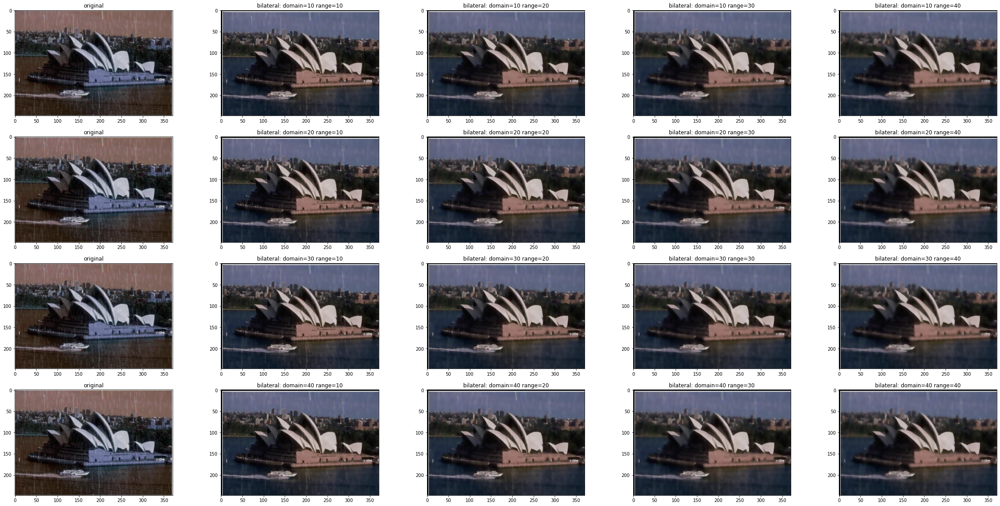

In [278]:
q4rain = cv2.imread("rain.png")
q4rain_b = q4rain[:,:,0]
q4rain_g = q4rain[:,:,1]
q4rain_r = q4rain[:,:,2]

fig, axs = plt.subplots(4,5,figsize=(40,20))
for i in tqdm(range(4)):
  axs[i][0].imshow(q4rain, cmap='gray')
  axs[i][0].set_title('original')
  d = 10*(i+1)
  for j in tqdm(range(4)):
    r = 10*(j+1)
    q4final = np.dstack((applyBilateralFilter(q4rain_r,d,r,7).astype(int), applyBilateralFilter(q4rain_g,d,r,7).astype(int), applyBilateralFilter(q4rain_b,d,r,7).astype(int)))
    axs[i][j+1].imshow(q4final, cmap='gray')
    # axs[i][j+1].imshow(q3mnt, cmap='gray')
    axs[i][j+1].set_title('bilateral: domain='+str(d)+' range='+str(r))

## Gaussian

0.46606494267439225
0.46606494267439225
0.46606494267439225


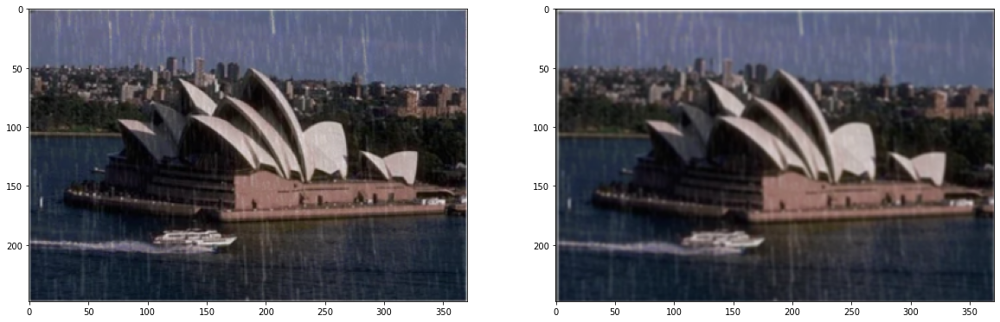

In [94]:
q4rain_b_gaus = np.rint(applyGaussianFilter(q4rain_b, 1, 3)).astype(int)
q4rain_g_gaus = np.rint(applyGaussianFilter(q4rain_g, 1, 3)).astype(int)
q4rain_r_gaus = np.rint(applyGaussianFilter(q4rain_r, 1, 3)).astype(int)

q4rain_gaus = np.dstack((q4rain_r_gaus, q4rain_g_gaus, q4rain_b_gaus))
fig, axs = plt.subplots(1,2, figsize=(20,20))
axs[0].imshow(cv2.cvtColor(q4rain, cv2.COLOR_BGR2RGB))
axs[1].imshow(q4rain_gaus)

In [90]:
def medianFilter(img, k):
    m,n = img.shape
    h = k//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = k%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            lis = []
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    # ret_img[u][v] += padded_img[u+i][v+j] * filt[h+i][h+j]
                    lis.append(padded_img[u+i][v+j])
            ret_img[u][v] = np.median(lis)
    return ret_img

## Median

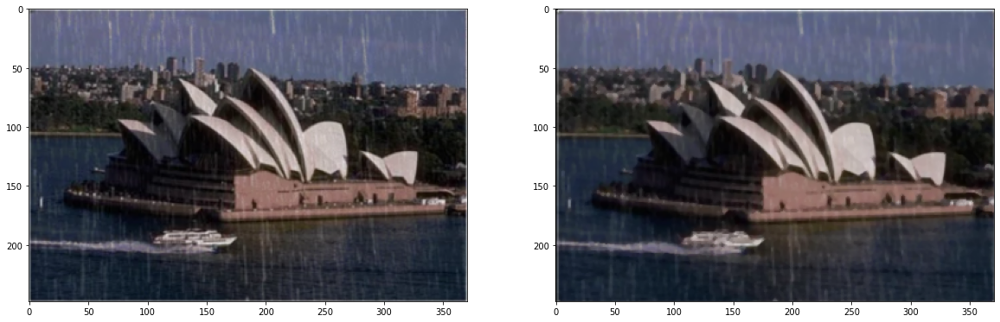

In [95]:
q4rain_b_med = np.rint(medianFilter(q4rain_b, 3)).astype(int)
q4rain_g_med = np.rint(medianFilter(q4rain_g, 3)).astype(int)
q4rain_r_med = np.rint(medianFilter(q4rain_r, 3)).astype(int)

q4rain_med = np.dstack((q4rain_r_med, q4rain_g_med, q4rain_b_med))
fig, axs = plt.subplots(1,2, figsize=(20,20))
axs[0].imshow(cv2.cvtColor(q4rain, cv2.COLOR_BGR2RGB))
axs[1].imshow(q4rain_med)

## Bilateral

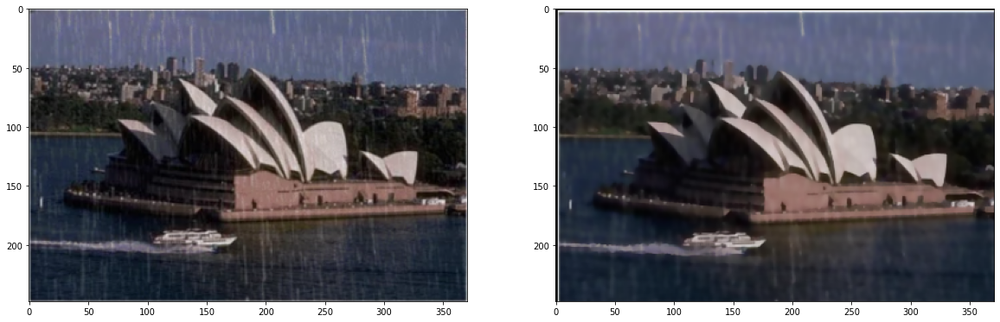

In [96]:
q4rain_b_bilat = np.rint(applyBilateralFilter(q4rain_b, 10,20,5)).astype(int)
q4rain_g_bilat = np.rint(applyBilateralFilter(q4rain_g, 10,20,5)).astype(int)
q4rain_r_bilat = np.rint(applyBilateralFilter(q4rain_r, 10,20,5)).astype(int)

q4rain_bilat = np.dstack((q4rain_r_bilat, q4rain_g_bilat, q4rain_b_bilat))
fig, axs = plt.subplots(1,2, figsize=(20,20))
axs[0].imshow(cv2.cvtColor(q4rain, cv2.COLOR_BGR2RGB))
axs[1].imshow(q4rain_bilat)

**Bilateral filtering** was the most effective of the three in removing rain and preserving details. The filter can be further fine-tuned for optimal result.

# Question 5: Cartoon effect

In [100]:
a = [1,0,1,0]
b = [1,1,0,0]
np.bitwise_and(a,b)

array([1, 0, 0, 0])

In [247]:
q5train = cv2.imread("bug.jpg")
q5train_b = q5train[:,:,0]
q5train_g = q5train[:,:,1]
q5train_r = q5train[:,:,2]
q5train.shape

(294, 600, 3)

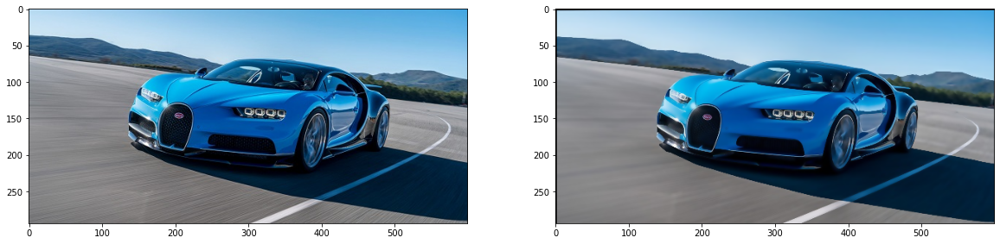

In [280]:
q5train_b_bilat = np.rint(applyBilateralFilter(q5train_b, 10,30,5)).astype(int)
q5train_g_bilat = np.rint(applyBilateralFilter(q5train_g, 10,30,5)).astype(int)
q5train_r_bilat = np.rint(applyBilateralFilter(q5train_r, 10,30,5)).astype(int)

q5train_bilat = np.dstack((q5train_r_bilat, q5train_g_bilat, q5train_b_bilat))
fig, axs = plt.subplots(1,2, figsize=(20,20))
axs[0].imshow(cv2.cvtColor(q5train, cv2.COLOR_BGR2RGB))
axs[1].imshow(q5train_bilat)

In [281]:
q5gray = cv2.cvtColor(q5train, cv2.COLOR_BGR2GRAY)

0.9946076967722629


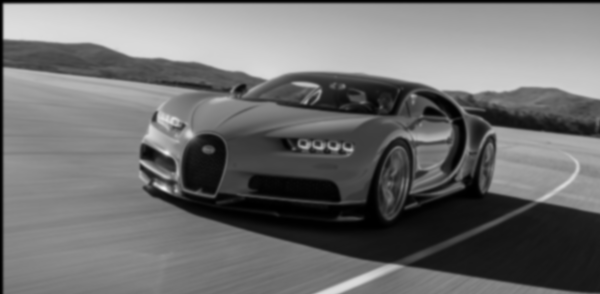

In [282]:
q5gray = cv2.cvtColor(q5train, cv2.COLOR_BGR2GRAY)
q5gray_gaus = applyGaussianFilter(q5gray, 3,7)
cv2_imshow(q5gray_gaus)

In [300]:
def adaptiveThresholding(img,filt):
    m,n=img.shape
    h=filt.shape[0]//2
    padded_img = np.zeros((m+2*h,n+2*h))
    padded_img[h:-h,h:-h] = img
    ret_img = np.zeros(img.shape)
    f = filt.shape[0]%2
    for u in range(img.shape[0]):
        for v in range(img.shape[1]):
            threshold=0
            for i in range(-h,h+f):
                for j in range(-h,h+f):
                    threshold += padded_img[u+i][v+j] * filt[h+i][h+j]
            if(padded_img[u][v]>threshold):
                ret_img[u][v]=255
            else:
                ret_img[u][v]=192
    return ret_img

0.9999988533940409


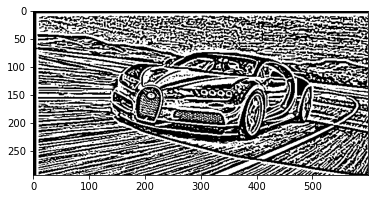

In [301]:
k = 5
gaus_fil = genGaussianFilter(5, 7)
q5train_edgemask = np.array(adaptiveThresholding(q5gray_gaus, gaus_fil), dtype=np.uint8)
mean_fil = np.ones((k,k))/k**2
# q5train_edgemask_mean = np.array(adaptiveThresholding(q5gray_gaus, mean_fil), dtype=np.uint8)
plt.imshow(q5train_edgemask, cmap='gray')

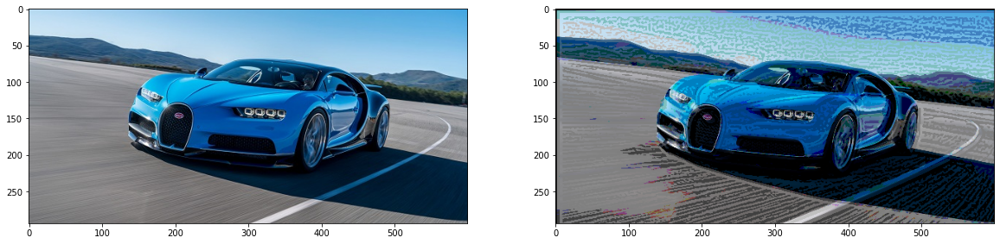

In [302]:
q5cartoon = np.zeros(q5train.shape,dtype=np.uint8)
q5cartoon[:,:,0]=q5train_bilat[:,:,0]&q5train_edgemask
q5cartoon[:,:,1]=q5train_bilat[:,:,1]&q5train_edgemask
q5cartoon[:,:,2]=q5train_bilat[:,:,2]&q5train_edgemask

fig, axs = plt.subplots(1,2,figsize=(20,20))
axs[0].imshow(cv2.cvtColor(q5train, cv2.COLOR_BGR2RGB))
axs[1].imshow(q5cartoon)

#Question 6

# Question 7

## Part 1: 2D DFT

In [314]:
def DFT2slow(img):
  m,n=img.shape
  ret_img = np.zeros(img.shape,dtype=complex)
  x, y = np.meshgrid(np.arange(n), np.arange(m))
  for k in range(m):
    for l in range(n):
      ret_img[k][l]=np.sum(np.multiply(img,np.exp(-1*2j*np.pi*((k*x)/m+(l*y)/n))))
  return ret_img

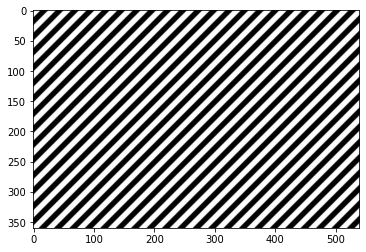

In [322]:
stripes=cv2.imread("stripes.jpg",cv2.IMREAD_GRAYSCALE)
stripes1=cv2.resize(stripes, (50,50), interpolation = cv2.INTER_AREA)
plt.imshow(strips,cmap='gray')

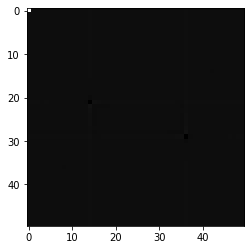

In [323]:
plt.imshow(np.real(DFT2slow(strips1)),cmap='gray')

In [324]:
def DFT2fast(img):
    M, N = img.shape
    m = np.asmatrix(np.arange(M))
    m = np.exp((-2j * np.pi / M) * m.T * m)
    n = np.asmatrix(np.arange(N))
    n = np.exp((-2j * np.pi / N) * n.T * n)
    return np.asarray(m * img * n)

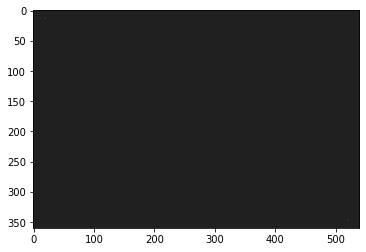

In [325]:
plt.imshow(np.real(DFT2fast(strips)),cmap='gray')

## Part 2: 2D FFT

In [326]:
def fft1(x):
  x = np.asarray(x, dtype=complex)
  N = x.shape[0]
  x = x.reshape((1, N))
  while x.shape[0] < N:
      m, n = x.shape
      odd, even = x[:, n // 2:], x[:, :n // 2]
      coff = np.exp(-1j * np.pi * np.arange(m) / m)[:, None]
      x = np.vstack((even + coff * odd, even - coff * odd))
  return x.ravel()

def fft2(x):
  m, n = x.shape
  M, N = 2 ** int(math.ceil(math.log(m, 2))), 2 ** int(math.ceil(math.log(n, 2)))
  f = np.zeros((M,N), dtype = x.dtype)
  f[0:m, 0:n] = x
  f = np.array([fft1(i) for i in f]).T
  f = np.array([fft1(i) for i in f]).T
  return f

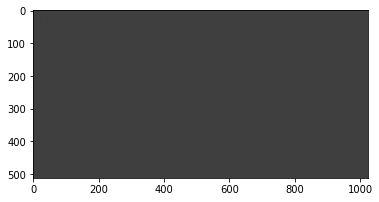

In [327]:
plt.imshow(np.real(fft2(stripes)),cmap='gray')

100%|██████████| 6/6 [01:16<00:00, 12.73s/it]


[Text(0, 0.5, 'runtime (in seconds)'), Text(0.5, 0, 'Image Size (x*x)')]

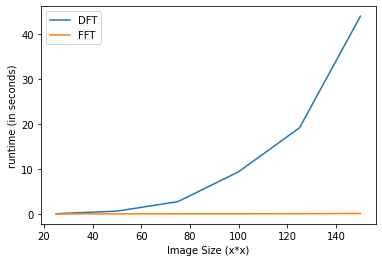

In [329]:
from time import time
fft_time=[]
dft_time=[]
for i in tqdm(np.arange(25,175,25)):
  # print(i)
  stripes_new=cv2.resize(stripes, (i,i), interpolation = cv2.INTER_AREA)
  start=time()
  temp=fft2(stripes_new)
  end=time()
  fft_time.append(end-start)
  start=time()
  temp=DFT2slow(stripes_new)
  end=time()
  dft_time.append(end-start)

x=np.arange(25,175,25)
ax = sns.lineplot(x=x,y=dft_time, label="DFT")
ax = sns.lineplot(x=x,y=fft_time, label="FFT")
ax.set(xlabel="Image Size (x*x)", ylabel="runtime (in seconds)")


## Part 3: 2D Inverse FFT

In [330]:
def ifft1(x):
  x = np.asarray(x, dtype=complex)
  N = x.shape[0]
  x = x.reshape((1, N))
  while x.shape[0] < N:
      m, n = x.shape
      odd, even = x[:, n // 2:], x[:, :n // 2]
      coff = np.exp(1j * np.pi * np.arange(m) / m)[:, None]
      x = np.vstack((even + coff * odd, even - coff * odd))
  return x.ravel()
def ifft2(x):
  m, n = x.shape
  M, N = 2 ** int(math.ceil(math.log(m, 2))), 2 ** int(math.ceil(math.log(n, 2)))
  f = np.zeros((M,N), dtype = x.dtype)
  f[0:m, 0:n] = x
  f = np.array([ifft1(i) for i in f]).T
  f = np.array([ifft1(i) for i in f]).T/(M*N)
  return f

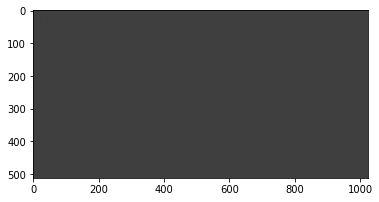

In [331]:
plt.imshow(np.real(ifft2(strips)),cmap='gray')

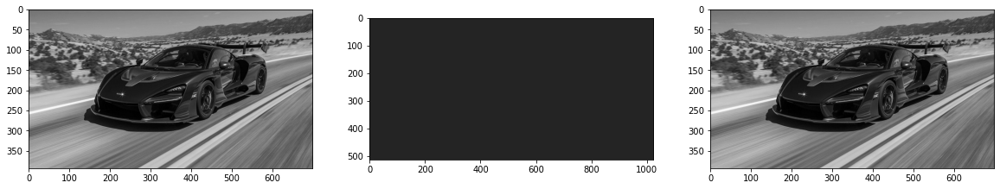

In [332]:
senna=cv2.imread("senna.jpg",0)
fwd=fft2(senna)
bck=ifft2(fwd)
fig, axs = plt.subplots(1,3,figsize=(20,20))
axs[0].imshow(senna,cmap='gray')
axs[1].imshow(np.real(fwd),cmap='gray')
axs[2].imshow(np.real(bck)[0:senna.shape[0],0:senna.shape[1]],cmap='gray')

## Part 4: FT of FT

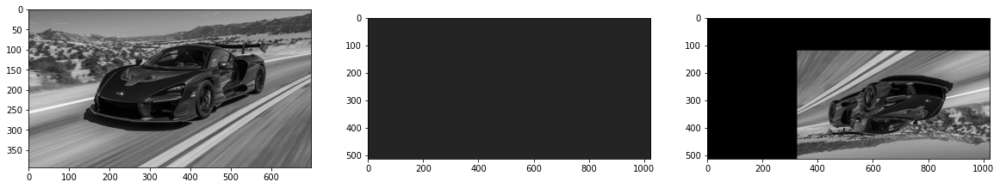

In [335]:
senna=cv2.imread("senna.jpg",0)
fwd=fft2(senna)
bck=fft2(fwd)
fig, axs = plt.subplots(1,3,figsize=(20,20))
axs[0].imshow(senna,cmap='gray')
axs[1].imshow(np.real(fwd),cmap='gray')
axs[2].imshow(np.real(bck),cmap='gray')

By doing a Fourier Transform of the Fourier Transform of an image, we get a vertically reflected image.

In this example, we see some padding in the final image which is due to the added padding in the original image (which is needed to apply FFT).

Correction: Should take conjugate of the Fourier Transform in its **Frequency Domain**

# Question 9: Morphological Operations

In [3]:
np.ones((5,5))

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [7]:
def unit_circle_vectorized(r):
    A = np.arange(-r,r+1)**2
    dists = np.sqrt(A[:,None] + A)
    return (np.abs(dists-r)<0.5).astype(int)

unit_circle_vectorized(5)

array([[0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]])

In [21]:
y,x = np.ogrid[-3: 3+1, -3: 3+1]
disc_mask = x**2+y**2 <= 3**2
disc_mask = 1*mask.astype(float)
disc_mask

array([[0., 0., 0., 1., 0., 0., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.]])

In [23]:
y,x = np.ogrid[-1: 1+1, -1: 1+1]
disc_mask = x**2+y**2 <= 1**2
disc_mask = 1*mask.astype(float)
disc_mask

array([[0., 0., 0., 1., 0., 0., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 1., 1., 1., 1., 1., 0.],
       [0., 0., 0., 1., 0., 0., 0.]])

Text(0.5, 1.0, 'Square SE: Dilation - Erosion')

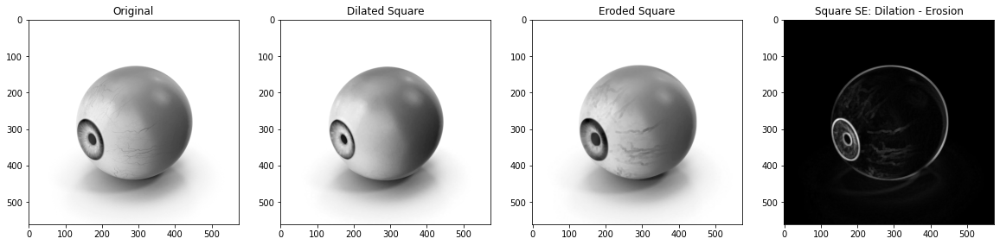

In [26]:
q9eye = cv2.imread("eye.png", 0)
se = np.ones((5,5))
q9dilated = cv2.dilate(q9eye, se)
q9eroded = cv2.erode(q9eye, se)
q9square_se = q9dilated - q9eroded
# q9dilated_disc = cv2.dilate(q9eye, disc_mask)
# q9eroded_disc = cv2.erode(q9eye, disc_mask)
# q9circle_se = q9dilated_disc - q9eroded_disc


fig, ax = plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(q9eye, cmap='gray')
ax[0].set_title("Original")
ax[1].imshow(q9dilated, cmap='gray')
ax[1].set_title("Dilated Square")
ax[2].imshow(q9eroded, cmap='gray')
ax[2].set_title("Eroded Square")
ax[3].imshow(q9square_se, cmap='gray')
ax[3].set_title("Square SE: Dilation - Erosion")

# ax[1][0].imshow(q9eye, cmap='gray')
# ax[1][0].set_title("Original")
# ax[1][1].imshow(q9dilated_disc, cmap='gray')
# ax[1][1].set_title("Dilated Circle")
# ax[1][2].imshow(q9eroded_disc, cmap='gray')
# ax[1][2].set_title("Eroded Circle")
# ax[1][3].imshow(q9circle_se, cmap='gray')
# ax[1][3].set_title("Circular SE")

# Question 10: Image Rotation

In [33]:
def rotImage(img, deg):
  rad = np.pi / 180 * deg
  m, n = img.shape
  padded_img = np.zeros((2*m,2*n))
  x_offset = m & 1
  y_offset = n & 1
  Ox, Oy = m//2, n//2
  padded_img[m-m//2:m+m//2 + x_offset, n-n//2:n+n//2 + y_offset] = img
  # cv2_imshow(padded_img)

  rotator = np.array([[ np.cos(rad), np.sin(rad)], 
                      [-np.sin(rad), np.cos(rad)]])
  rotM, rotN = 2*m, 2*n
  ret_img = np.zeros((rotM, rotN))

  for i in range(rotM):
    for j in range(rotN):
      rotX = (i-m) * rotator[0]
      Xrot = (i-m) * rotator[0][0] + (j-n) * rotator[0][1] + m 
      Yrot = (i-m) * rotator[1][0] + (j-n) * rotator[1][1] + n

      p = np.floor(Xrot).astype(int)
      q = np.floor(Yrot).astype(int)
      a = Xrot - p
      b = Yrot - q

      if p>=0 and p<rotM and q>=0 and q<rotN:
        ret_img[i, j] += (1-a)*(1-b) * padded_img[p, q]
      if p>=0 and p<rotM and q+1 >=0 and q+1<rotN:
        ret_img[i, j] += (1-a)* b * padded_img[p, q+1]
      if p+1>=0 and p+1<rotM and q>=0 and q<rotN:
        ret_img[i, j] += a * (1-b) * padded_img[p+1, q]
      if p+1>=0 and p+1<rotM and q+1>=0 and q+1<rotN:
        ret_img[i, j] += a* b * padded_img[p+1, q+1]
  return ret_img

Text(0.5, 1.0, '280 degrees')

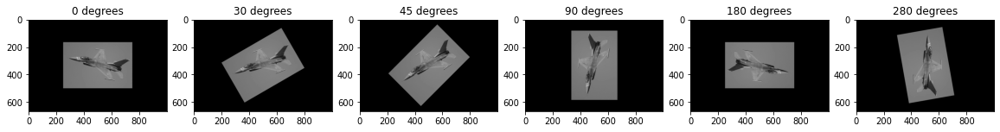

In [34]:
q10f16 = cv2.imread("f16.jpg",0)

fig, ax = plt.subplots(1,6, figsize=(20,20))
ax[0].imshow(rotImage(q10f16,0), cmap='gray')
ax[1].imshow(rotImage(q10f16,30), cmap='gray')
ax[2].imshow(rotImage(q10f16,45), cmap='gray')
ax[3].imshow(rotImage(q10f16,90), cmap='gray')
ax[4].imshow(rotImage(q10f16,180), cmap='gray')
ax[5].imshow(rotImage(q10f16,280), cmap='gray')
ax[0].set_title('0 degrees')
ax[1].set_title('30 degrees')
ax[2].set_title('45 degrees')
ax[3].set_title('90 degrees')
ax[4].set_title('180 degrees')
ax[5].set_title('280 degrees')